In [16]:
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

# ================= KONFIGURATION =================
BASE_GT_DIR = Path("./gt_labels_np_new")  # Pfad zu deinem GT-Hauptordner
IMAGES_DIR = BASE_GT_DIR / "images"  # Ordner mit den Originalbildern
MODEL_PATH = Path(
    "./runs/segment/train-17/weights/best.pt"
)  # Dein trainiertes YOLO-Modell

# Nur die ersten 4 Videos verwenden
TARGET_FOLDERS = [
    #"fishvideo_24_0010",
    "fishvideo_05_0010",
    "fishvideo_06_0010",
    "fishvideo_07_0010",
    "fishvideo_08_0010",
    "fishvideo_30_0010",
    "fishvideo_38_0010",
    "fishvideo_40_0010",

]

CONF_THRESHOLD = 0.25  # Konfidenz-Schwelle für YOLO
# =================================================

print("Bibliotheken geladen und Pfade gesetzt!")

Bibliotheken geladen und Pfade gesetzt!


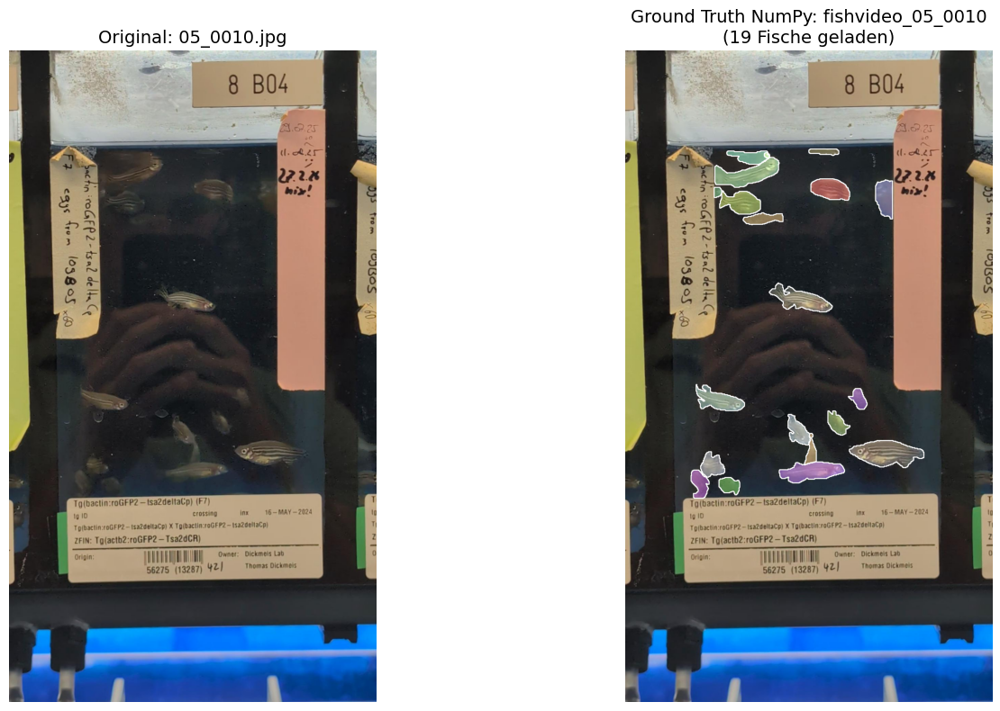

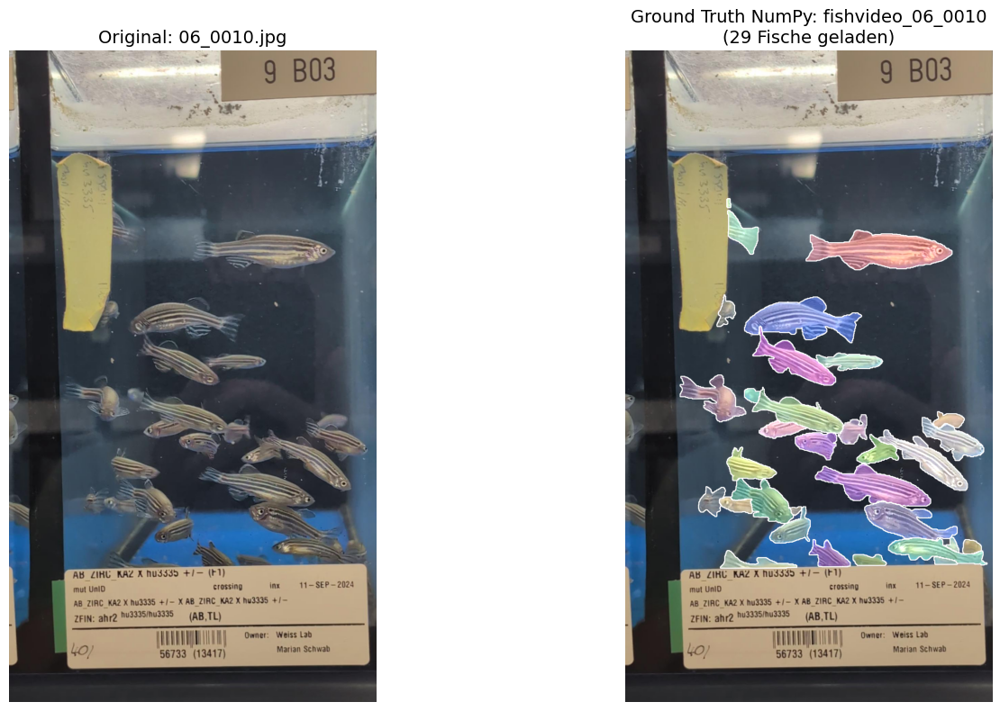

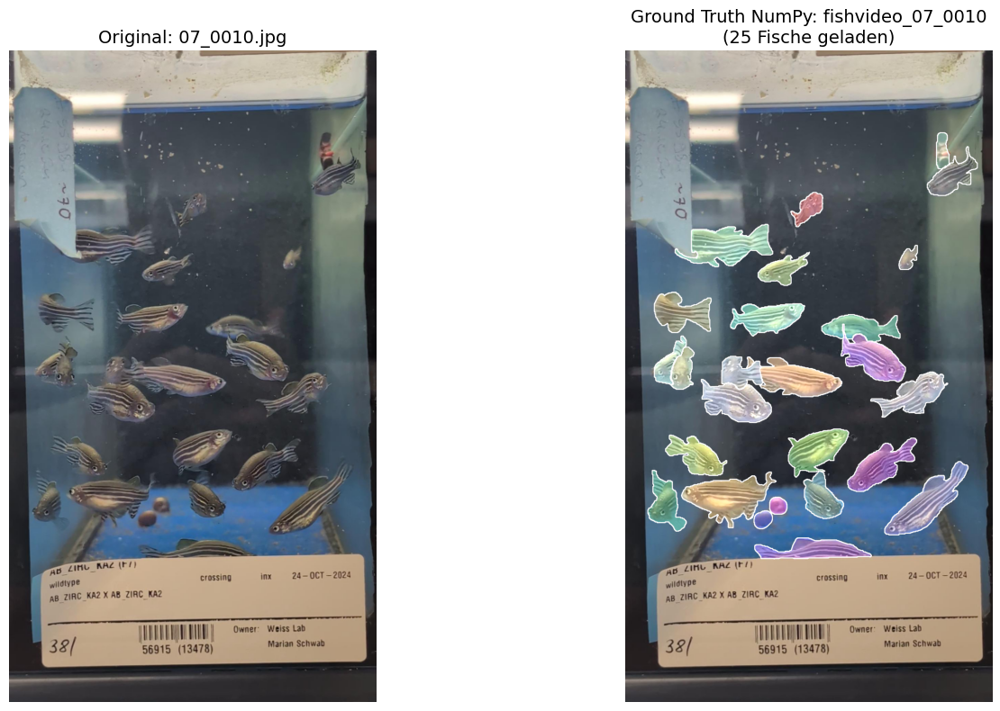

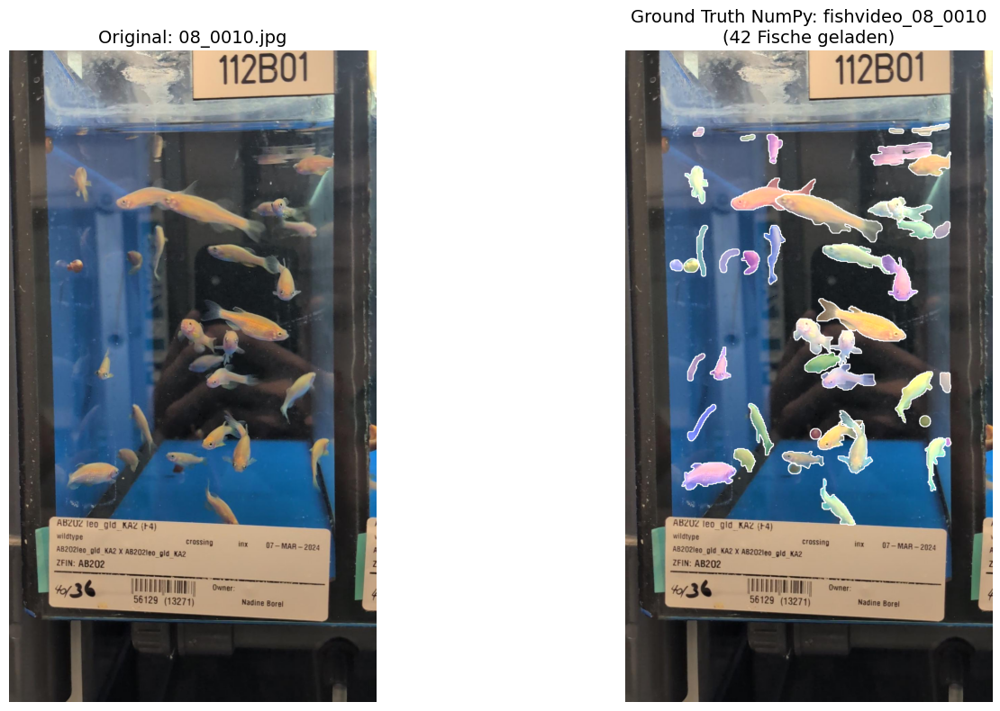

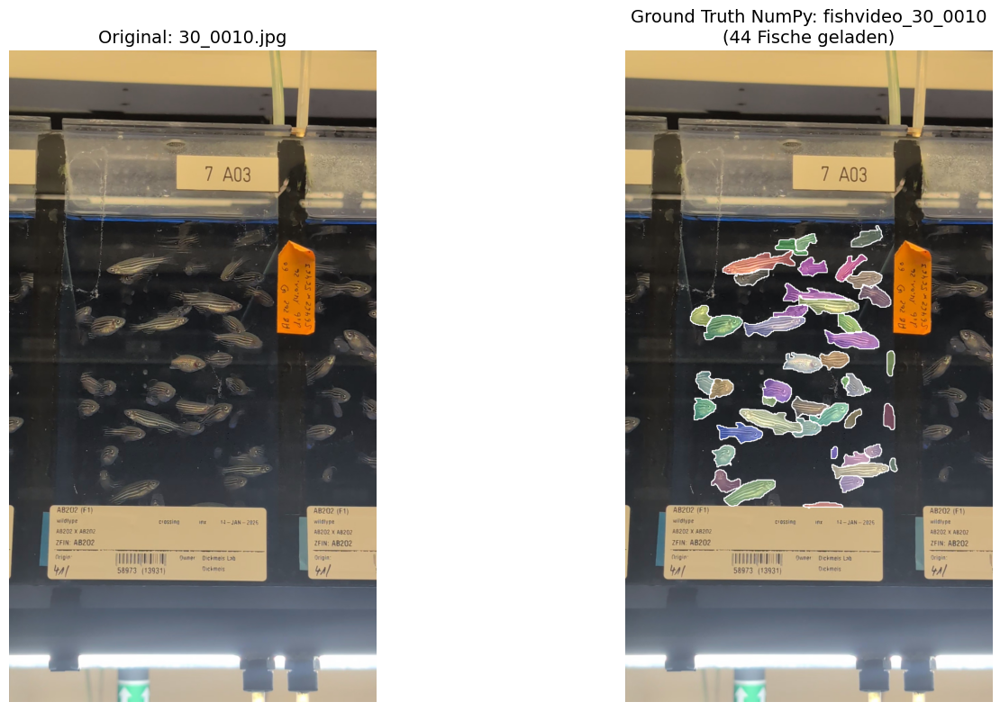

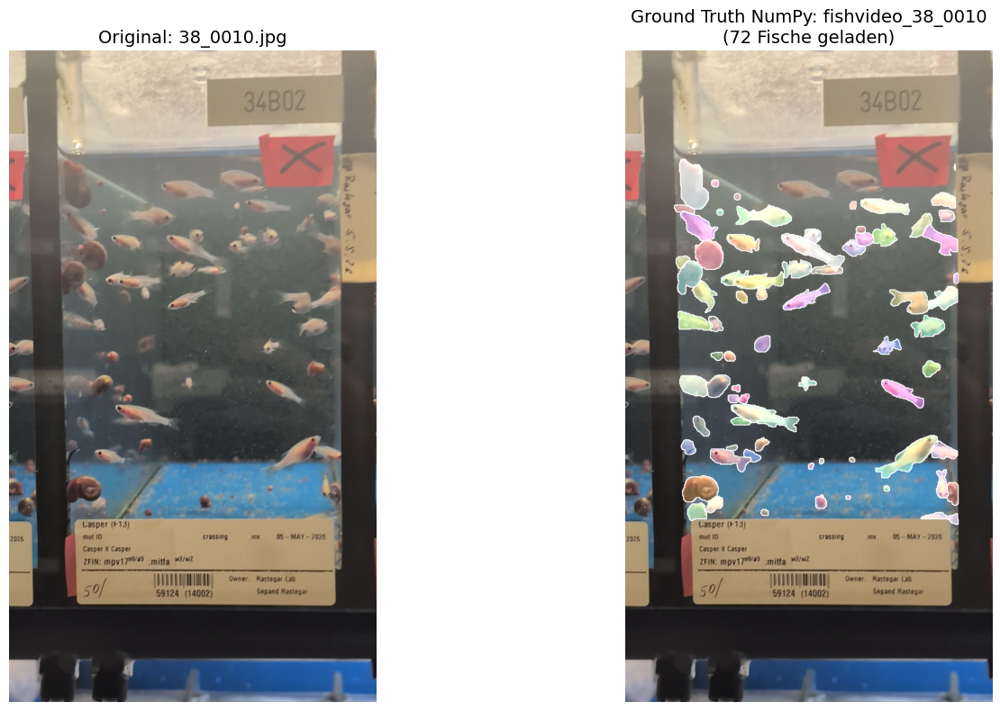

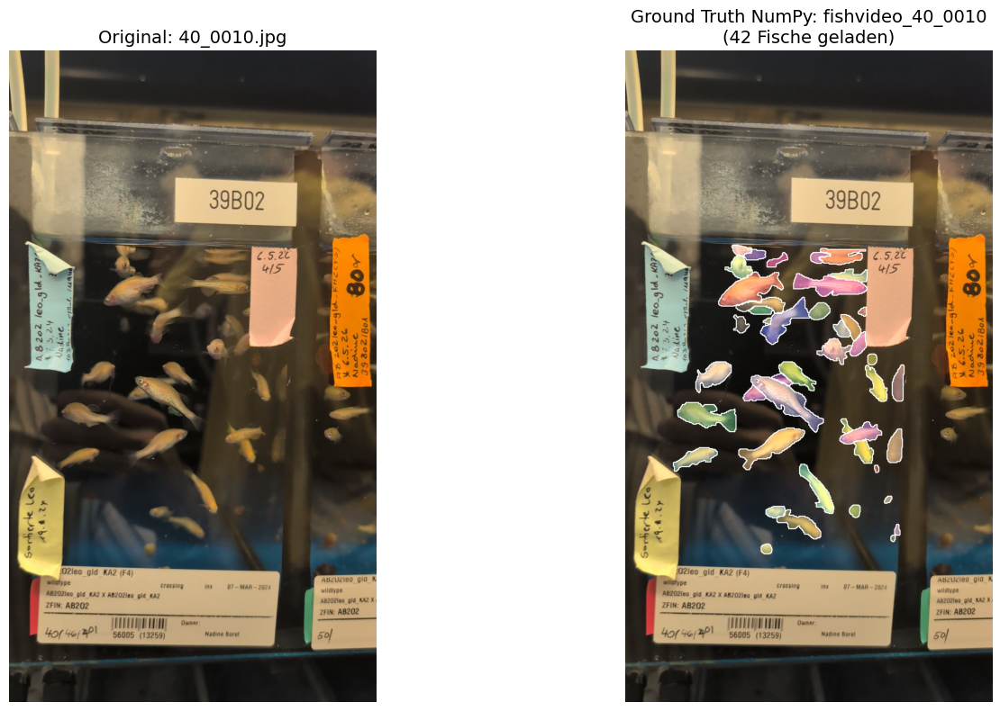

In [17]:
# Hilfsfunktion: Feste, unterscheidbare Farbe pro Fisch-Index
def get_color_for_index(idx):
    np.random.seed(idx * 47 + 5)
    return np.random.randint(60, 255, size=3).tolist()


for folder_name in TARGET_FOLDERS:
    folder_path = BASE_GT_DIR / folder_name
    if not folder_path.exists():
        print(f"[!] Ordner nicht gefunden: {folder_path}")
        continue

    # 1. Passendes Bild finden (sucht nach 01_0010.jpg, fishvideo_01_0010.jpg etc.)
    # Wir extrahieren die Video-ID (z.B. '01_0010')
    short_name = folder_name.replace("fishvideo_", "")
    possible_imgs = list(IMAGES_DIR.glob(f"*{short_name}*.jpg")) + list(
        IMAGES_DIR.glob(f"*{folder_name}*.jpg")
    )

    if not possible_imgs:
        print(f"[!] Kein passendes Bild in {IMAGES_DIR} für {folder_name} gefunden.")
        continue

    img_path = possible_imgs[0]
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]

    # 2. Alle .npy/.npz Masken-Dateien in diesem Ordner laden
    npy_files = sorted(list(folder_path.glob("*.npy"))) + sorted(
        list(folder_path.glob("*.npz"))
    )

    overlay = img_rgb.copy()
    num_fishes = 0

    for idx, npy_file in enumerate(npy_files):
        if npy_file.suffix == ".npz":
            data = np.load(npy_file)
            mask = data[list(data.keys())[0]]
        else:
            mask = np.load(npy_file)

        mask = mask.astype(np.uint8)
        if mask.ndim == 3:
            mask = mask.squeeze()

        # Sicherstellen, dass die Maske zur Bildgröße passt
        if mask.shape[:2] != (h, w):
            mask = cv2.resize(mask, (w, h), interpolation=cv2.INTER_NEAREST)

        binary_mask = (mask > 0).astype(np.uint8)
        if binary_mask.sum() == 0:
            continue

        num_fishes += 1
        color = get_color_for_index(idx)

        # A) Farbige Füllung (beide Teile des Fisches bekommen exakt dieselbe Farbe!)
        single_mask_layer = np.zeros((h, w, 3), dtype=np.uint8)
        single_mask_layer[binary_mask == 1] = color
        overlay = cv2.addWeighted(overlay, 1.0, single_mask_layer, 0.45, 0)

        # B) Weiße Konturlinien um alle Teile dieser Fisch-Instanz zeichnen
        contours, _ = cv2.findContours(
            binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
        )
        cv2.polylines(
            overlay,
            contours,
            isClosed=True,
            color=(255, 255, 255),
            thickness=2,
        )

    # 3. Plot nebeneinander anzeigen
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    axes[0].imshow(img_rgb)
    axes[0].set_title(f"Original: {img_path.name}", fontsize=14)
    axes[0].axis("off")

    axes[1].imshow(overlay)
    axes[1].set_title(
        f"Ground Truth NumPy: {folder_name}\n({num_fishes} Fische geladen)",
        fontsize=14,
    )
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

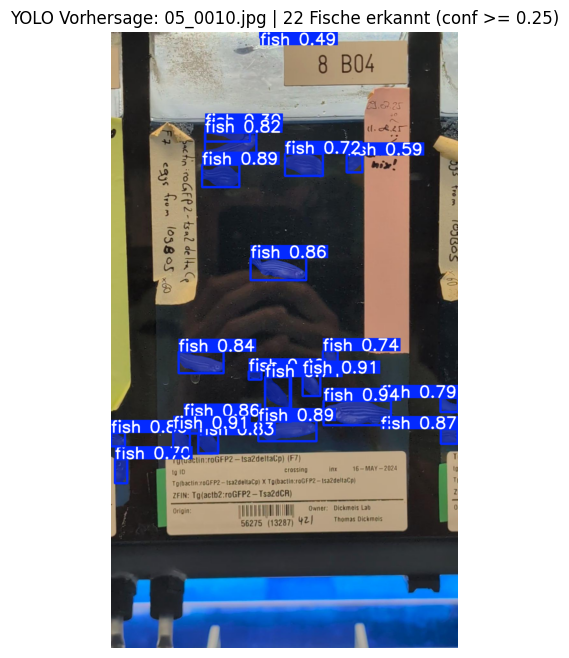

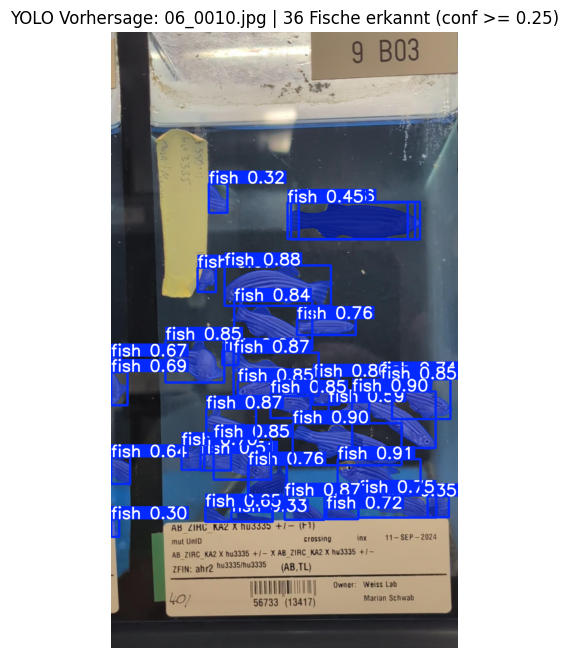

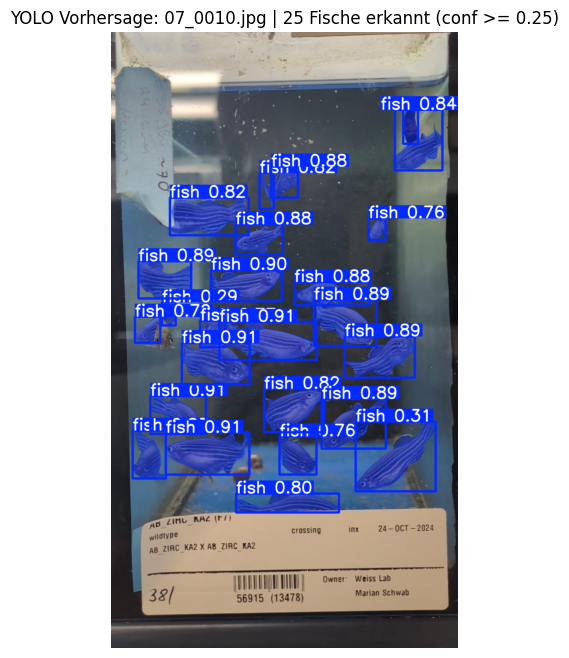

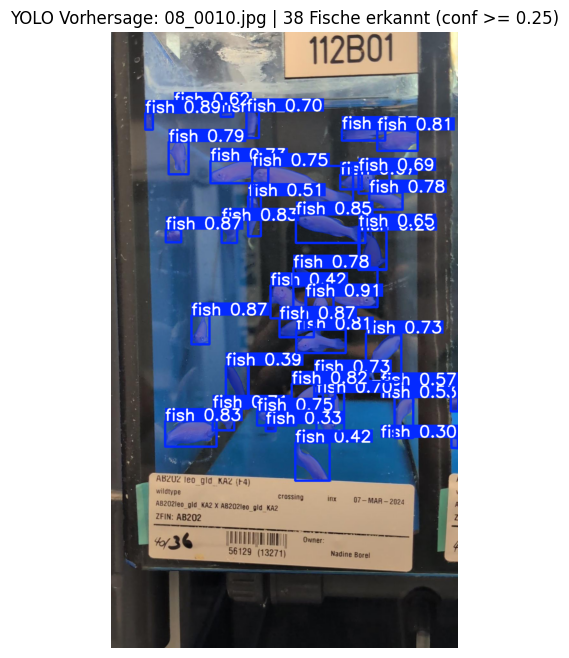

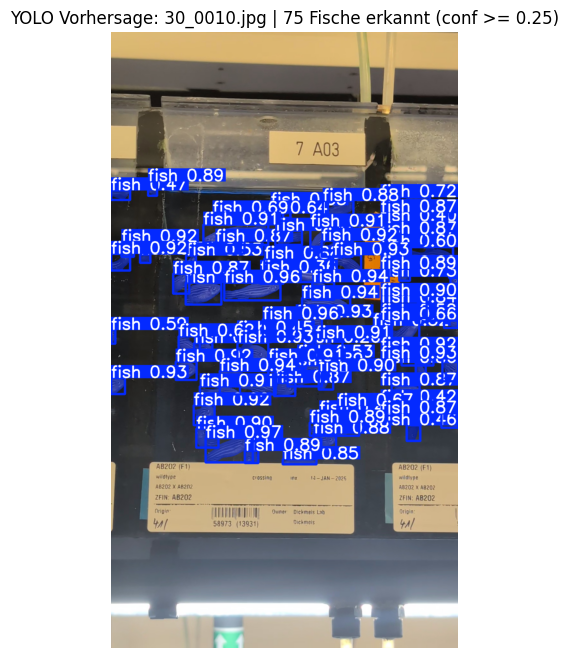

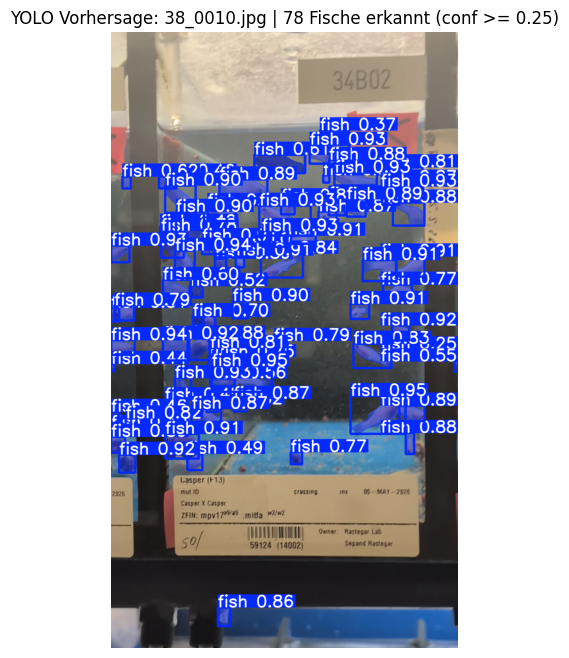

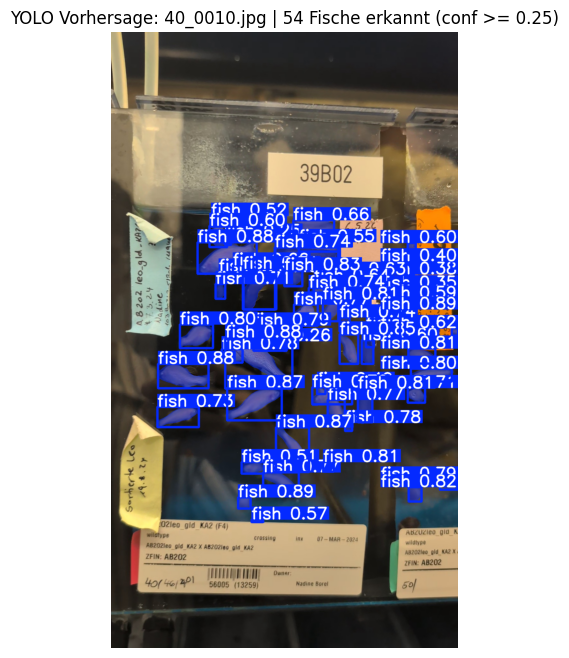

In [18]:
# 1. Trainiertes Modell laden
model = YOLO(MODEL_PATH)

# 2. Inferenz auf den 4 Testbildern ausführen
for folder_name in TARGET_FOLDERS:
    short_name = folder_name.replace("fishvideo_", "")
    possible_imgs = list(IMAGES_DIR.glob(f"*{short_name}*.jpg")) + list(
        IMAGES_DIR.glob(f"*{folder_name}*.jpg")
    )

    if not possible_imgs:
        continue

    img_path = possible_imgs[0]
    img = cv2.imread(str(img_path))
    h, w = img.shape[:2]

    # YOLO Vorhersage ausführen
    results = model.predict(
        source=str(img_path), conf=CONF_THRESHOLD, imgsz=max(h, w), verbose=False
    )

    # Plot mit Masken & Boxen rendern
    pred_plot = results[0].plot()
    pred_plot_rgb = cv2.cvtColor(pred_plot, cv2.COLOR_BGR2RGB)

    num_detected = len(results[0].boxes) if results[0].boxes is not None else 0

    # Anzeige im Notebook
    plt.figure(figsize=(10, 8))
    plt.imshow(pred_plot_rgb)
    plt.title(
        f"YOLO Vorhersage: {img_path.name} | {num_detected} Fische erkannt (conf >= {CONF_THRESHOLD})"
    )
    plt.axis("off")
    plt.show()

1. Sammle Ground-Truth-Instanzen und führe YOLO-Inferenz aus...

     1. GROUND-TRUTH PERSPEKTIVE: Wieviel % welcher Klasse erkennt YOLO?
    GT-Klasse  Gesamt im GT-Set  Von YOLO als 'Fisch' erkannt  Erkennungsrate (%)
        Fisch               197                           177               89.85
FishNeighbour                 9                             4               44.44
   Reflection                29                            14               48.28
        Snail                38                            19               50.00

     2. VORHERSAGEN PERSPEKTIVE: Was steckt hinter den 328 YOLO-Detektionen?
                 Kategorie  Anzahl Vorhersagen  Anteil (%)
         Echter Fisch (TP)                 187       57.01
        FishNeighbour (FP)                   5        1.52
           Reflection (FP)                  14        4.27
                Snail (FP)                  19        5.79
Sonstiger Hintergrund (FP)                 103       31.40


/tmp/ipykernel_7116/2862448905.py:247: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(


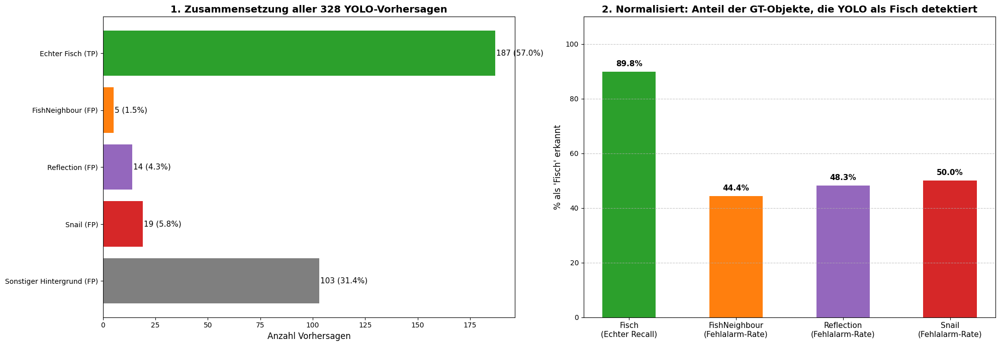


[+] Abbildung erfolgreich gespeichert als 'yolo_comprehensive_evaluation.png'!


In [20]:
import json
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from ultralytics import YOLO

# ================= KONFIGURATION =================
CLASSES_GT = {
    1: "Fisch",
    2: "FishNeighbour",
    3: "Reflection",
    4: "Snail",
}

IOU_THRESHOLD = 0.5  # Ab wann gilt eine Überdeckung als Treffer?
CONF_THRESHOLD = 0.25  # Konfidenz-Schwelle für YOLO
# =================================================

print("1. Sammle Ground-Truth-Instanzen und führe YOLO-Inferenz aus...")

gt_objects = []
pred_objects = []

model = YOLO(MODEL_PATH)
img_id = 0

for folder_name in TARGET_FOLDERS:
    folder_path = BASE_GT_DIR / folder_name
    short_name = folder_name.replace("fishvideo_", "")
    possible_imgs = list(IMAGES_DIR.glob(f"*{short_name}*.jpg")) + list(
        IMAGES_DIR.glob(f"*{folder_name}*.jpg")
    )

    if not possible_imgs or not folder_path.exists():
        continue

    img_path = possible_imgs[0]
    img = cv2.imread(str(img_path))
    h, w = img.shape[:2]
    img_id += 1

    # --- A) Ground Truth Masken laden & Klasse präzise ermitteln ---
    npy_files = list(folder_path.rglob("*.npy")) + list(
        folder_path.rglob("*.npz")
    )

    for npy_file in npy_files:
        if npy_file.suffix == ".npz":
            data = np.load(npy_file)
            mask = data[list(data.keys())[0]]
        else:
            mask = np.load(npy_file)

        mask = mask.astype(np.uint8)
        if mask.ndim == 3:
            mask = mask.squeeze()
        if mask.shape[:2] != (h, w):
            mask = cv2.resize(mask, (w, h), interpolation=cv2.INTER_NEAREST)

        bin_mask = (mask > 0).astype(np.uint8)
        if bin_mask.sum() == 0:
            continue

        file_lower = str(npy_file).lower()

        if "neighbour" in file_lower or "neighbor" in file_lower:
            c_id = 2
        elif "reflect" in file_lower or "reflex" in file_lower:
            c_id = 3
        elif "snail" in file_lower or "schnecke" in file_lower:
            c_id = 4
        else:
            c_id = 1

        gt_objects.append(
            {
                "image_id": img_id,
                "class_id": c_id,
                "class_name": CLASSES_GT[c_id],
                "mask": bin_mask,
                "matched": False,
            }
        )

    # --- B) YOLO Vorhersagen sammeln ---
    results = model.predict(
        source=str(img_path),
        conf=CONF_THRESHOLD,
        imgsz=max(h, w),
        verbose=False,
    )

    if results[0].masks is not None:
        p_masks = results[0].masks.data.cpu().numpy()
        confs = results[0].boxes.conf.cpu().numpy()

        for m, conf in zip(p_masks, confs):
            m_res = cv2.resize(m, (w, h), interpolation=cv2.INTER_NEAREST)
            bin_pred = (m_res > 0.5).astype(np.uint8)
            if bin_pred.sum() > 0:
                pred_objects.append(
                    {"image_id": img_id, "mask": bin_pred, "conf": float(conf)}
                )


# 2. Matching-Logik (IoU-Vergleich)
def calc_iou(m1, m2):
    inter = np.logical_and(m1, m2).sum()
    union = np.logical_or(m1, m2).sum()
    return inter / union if union > 0 else 0.0


# Zähler für Vorhersagen-Sicht (Precision)
pred_breakdown = {
    "Echter Fisch (TP)": 0,
    "FishNeighbour (FP)": 0,
    "Reflection (FP)": 0,
    "Snail (FP)": 0,
    "Sonstiger Hintergrund (FP)": 0,
}

# Matching durchführen
for pred in pred_objects:
    best_iou = 0.0
    best_gt = None

    for gt in gt_objects:
        if gt["image_id"] != pred["image_id"]:
            continue
        iou = calc_iou(pred["mask"], gt["mask"])
        if iou > best_iou:
            best_iou = iou
            best_gt = gt

    if best_iou >= IOU_THRESHOLD and best_gt is not None:
        if best_gt["class_id"] == 1:
            pred_breakdown["Echter Fisch (TP)"] += 1
            best_gt["matched"] = True
        elif best_gt["class_id"] == 2:
            pred_breakdown["FishNeighbour (FP)"] += 1
            best_gt["matched"] = True
        elif best_gt["class_id"] == 3:
            pred_breakdown["Reflection (FP)"] += 1
            best_gt["matched"] = True
        elif best_gt["class_id"] == 4:
            pred_breakdown["Snail (FP)"] += 1
            best_gt["matched"] = True
    else:
        pred_breakdown["Sonstiger Hintergrund (FP)"] += 1

# 3. Ground-Truth-Sicht (Normalisierte Erkennungsrate pro GT-Klasse)
gt_stats = []
for c_id, c_name in CLASSES_GT.items():
    total_gt = sum(1 for g in gt_objects if g["class_id"] == c_id)
    detected_as_fish = sum(
        1 for g in gt_objects if g["class_id"] == c_id and g["matched"]
    )
    rate = (detected_as_fish / total_gt * 100) if total_gt > 0 else 0.0

    gt_stats.append(
        {
            "GT-Klasse": c_name,
            "Gesamt im GT-Set": total_gt,
            "Von YOLO als 'Fisch' erkannt": detected_as_fish,
            "Erkennungsrate (%)": round(rate, 2),
        }
    )

df_gt = pd.DataFrame(gt_stats)

# 4. Tabellen-Ausgabe im Terminal
print("\n" + "=" * 75)
print(
    f"     1. GROUND-TRUTH PERSPEKTIVE: Wieviel % welcher Klasse erkennt YOLO?"
)
print("=" * 75)
print(df_gt.to_string(index=False))

df_pred = pd.DataFrame(
    list(pred_breakdown.items()), columns=["Kategorie", "Anzahl Vorhersagen"]
)
df_pred["Anteil (%)"] = (
    df_pred["Anzahl Vorhersagen"] / len(pred_objects) * 100
).round(2)

print("\n" + "=" * 75)
print(
    f"     2. VORHERSAGEN PERSPEKTIVE: Was steckt hinter den {len(pred_objects)} YOLO-Detektionen?"
)
print("=" * 75)
print(df_pred.to_string(index=False))

# 5. Doppel-Plot für die Masterarbeit
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# --- LINKER PLOT: Vorhersagen-Zusammensetzung ---
colors_pred = ["#2ca02c", "#ff7f0e", "#9467bd", "#d62728", "#7f7f7f"]
bars1 = axes[0].barh(
    df_pred["Kategorie"], df_pred["Anzahl Vorhersagen"], color=colors_pred
)
axes[0].set_xlabel("Anzahl Vorhersagen", fontsize=12)
axes[0].set_title(
    f"1. Zusammensetzung aller {len(pred_objects)} YOLO-Vorhersagen",
    fontsize=14,
    fontweight="bold",
)
axes[0].invert_yaxis()

for bar in bars1:
    w = bar.get_width()
    axes[0].text(
        w + 0.5,
        bar.get_y() + bar.get_height() / 2,
        f"{int(w)} ({w/len(pred_objects)*100:.1f}%)",
        va="center",
        fontsize=11,
    )

# --- RECHTER PLOT: Normalisierter Recall / False Alarm Rate pro GT-Klasse ---
colors_gt = ["#2ca02c", "#ff7f0e", "#9467bd", "#d62728"]
bars2 = axes[1].bar(
    df_gt["GT-Klasse"], df_gt["Erkennungsrate (%)"], color=colors_gt, width=0.5
)
axes[1].set_ylabel("% als 'Fisch' erkannt", fontsize=12)
axes[1].set_ylim(0, 110)
axes[1].set_title(
    "2. Normalisiert: Anteil der GT-Objekte, die YOLO als Fisch detektiert",
    fontsize=14,
    fontweight="bold",
)
axes[1].grid(axis="y", linestyle="--", alpha=0.7)

for bar in bars2:
    h_val = bar.get_height()
    axes[1].text(
        bar.get_x() + bar.get_width() / 2,
        h_val + 2,
        f"{h_val:.1f}%",
        ha="center",
        fontsize=11,
        fontweight="bold",
    )

# Erklärungs-Hinweise unter den rechten Balken
axes[1].set_xticklabels(
    [
        "Fisch\n(Echter Recall)",
        "FishNeighbour\n(Fehlalarm-Rate)",
        "Reflection\n(Fehlalarm-Rate)",
        "Snail\n(Fehlalarm-Rate)",
    ],
    fontsize=11,
)

plt.tight_layout()
plt.savefig("yolo_comprehensive_evaluation.png", dpi=300)
plt.show()

print(
    "\n[+] Abbildung erfolgreich gespeichert als 'yolo_comprehensive_evaluation.png'!"
)

Visualisiere Hintergrund-Fehlalarme mit perfekt lesbarem Text...



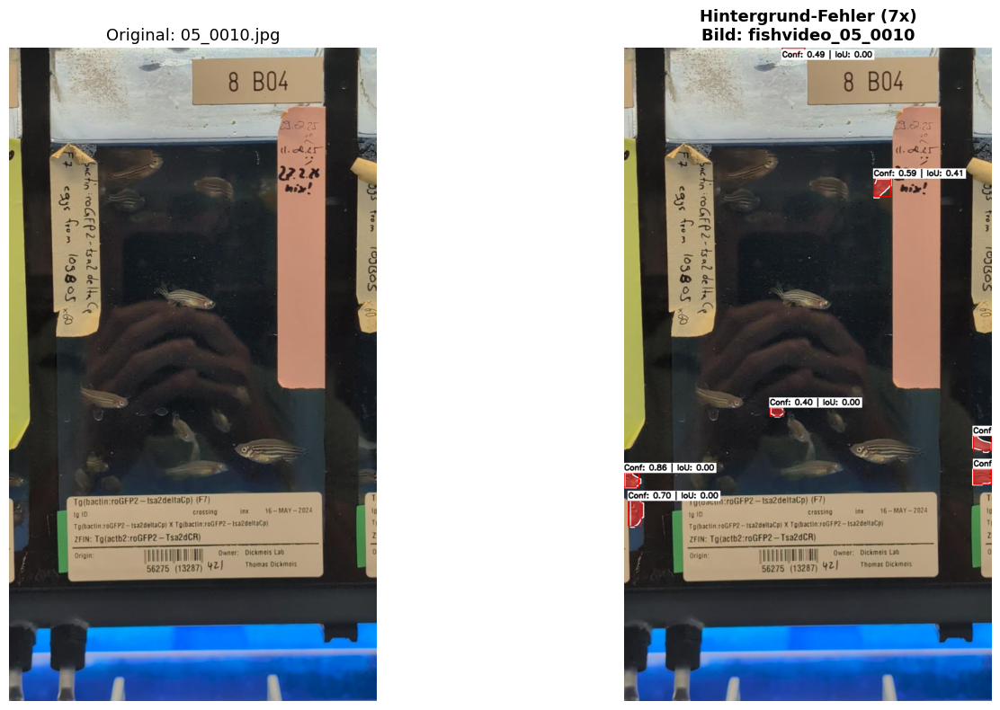

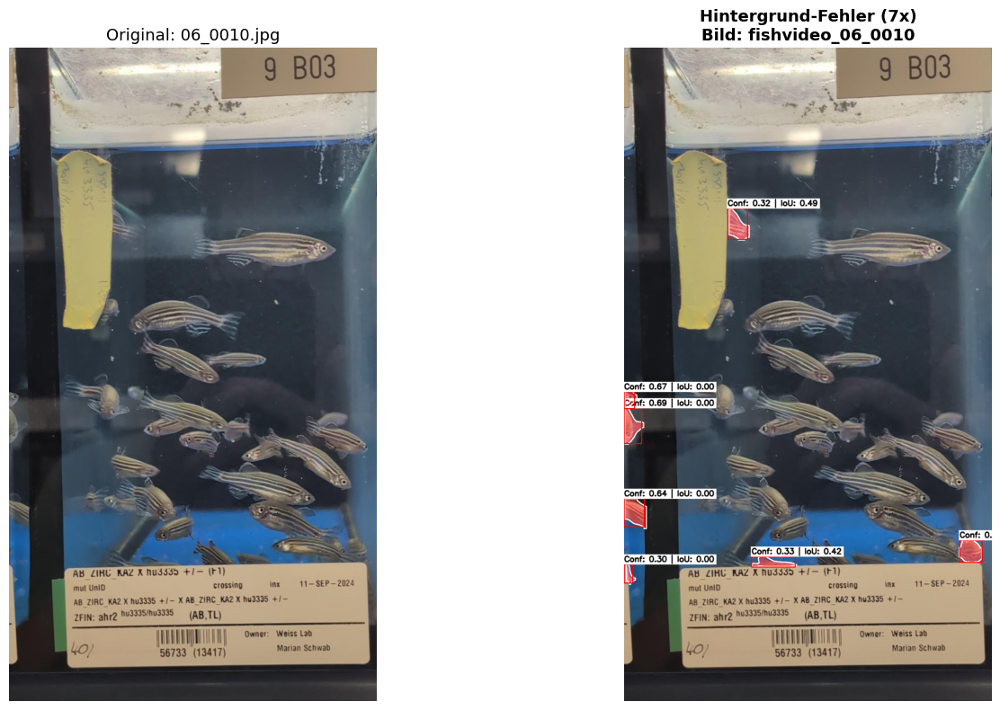

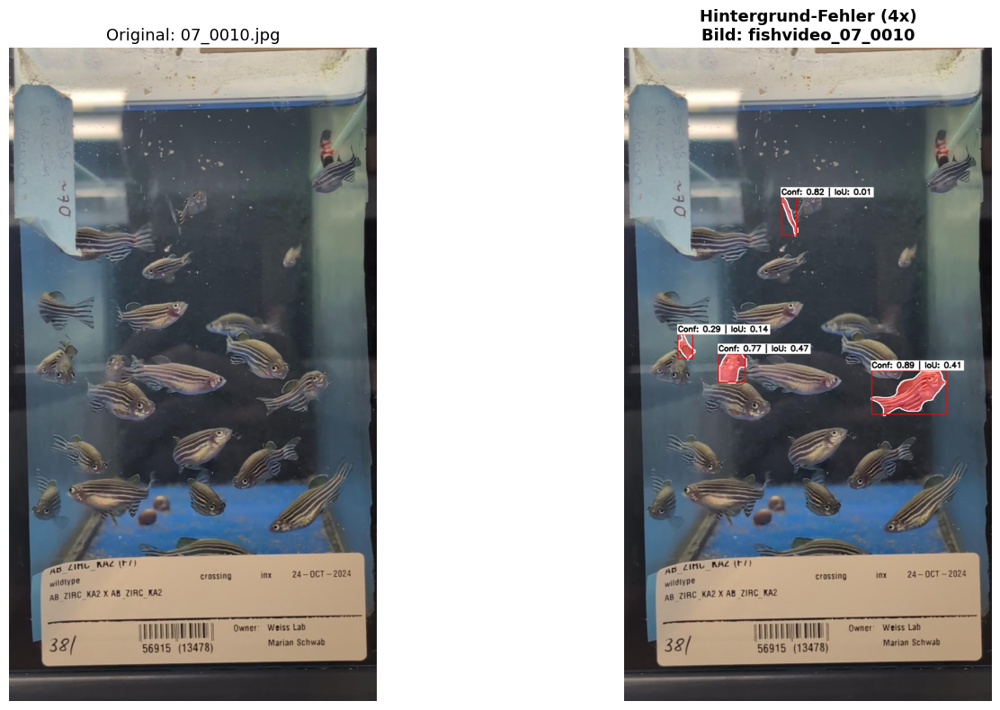

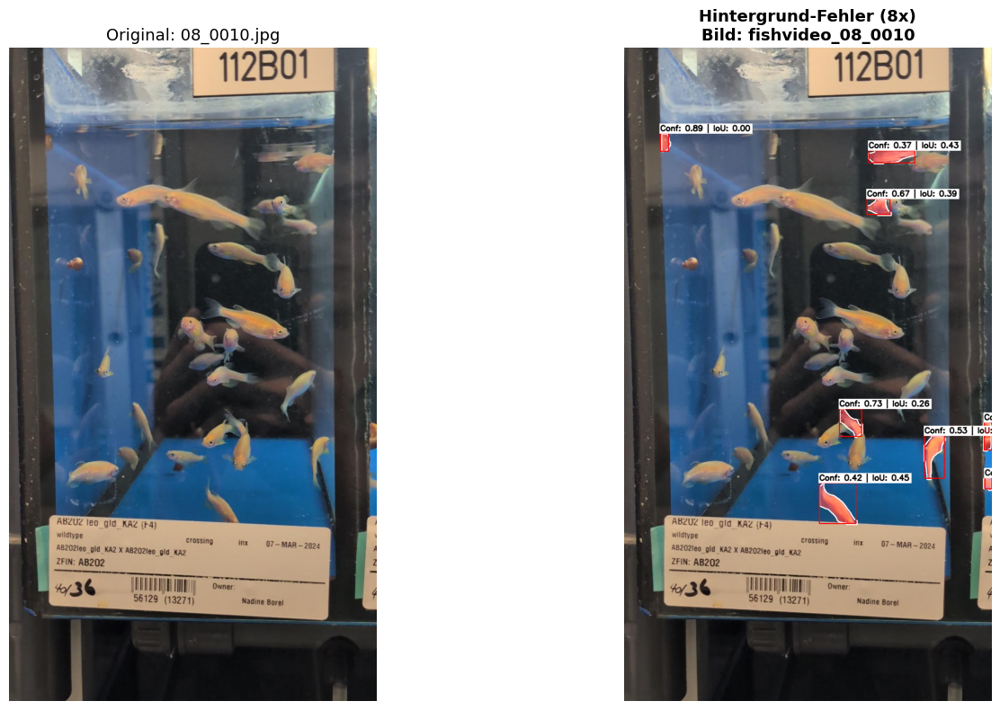

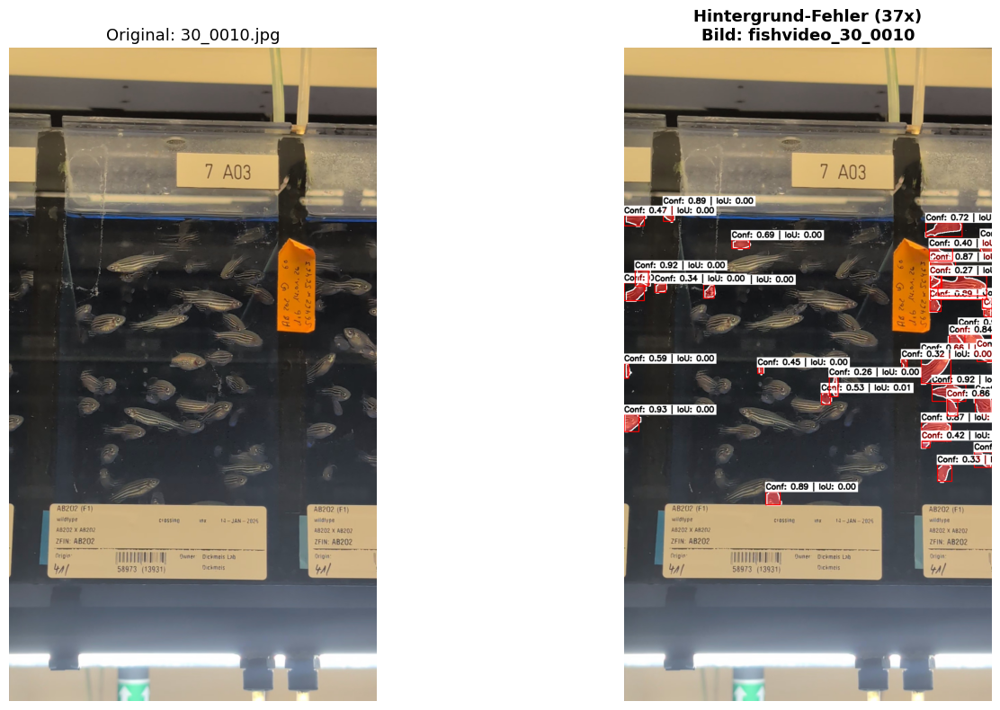

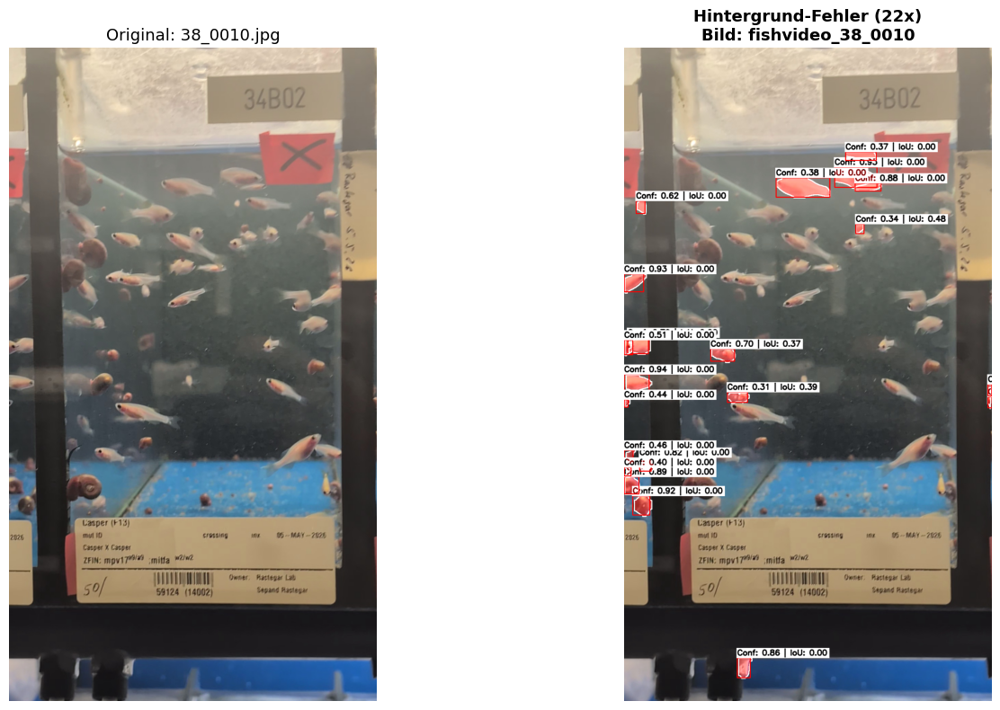

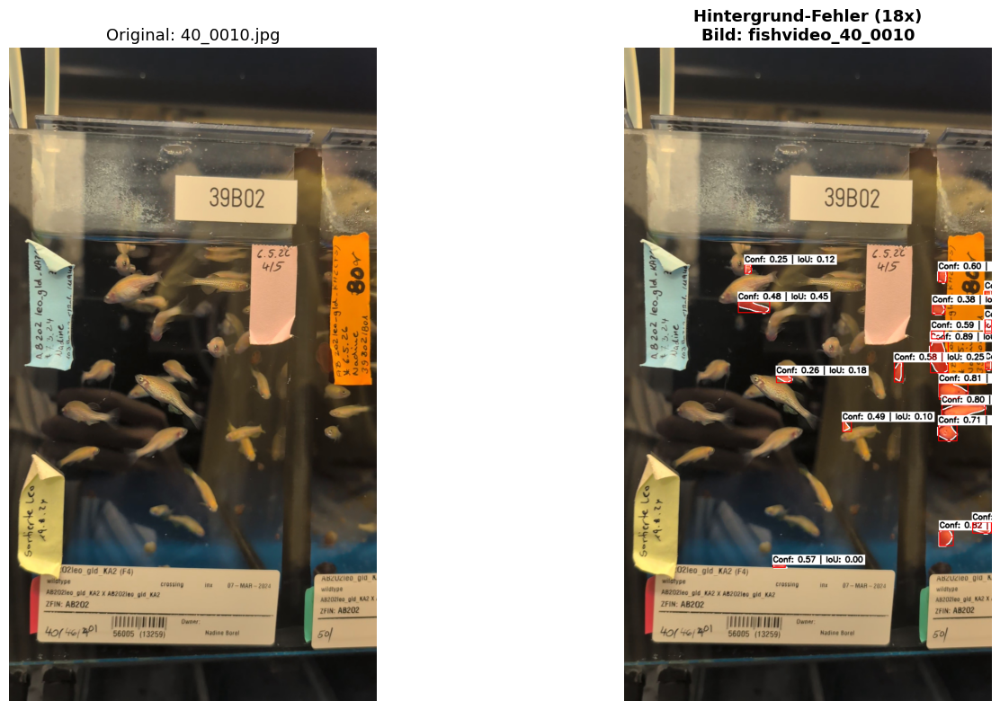

In [27]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# ================= KONFIGURATION =================
IOU_THRESHOLD = 0.5
CONF_THRESHOLD = 0.25
# =================================================

print("Visualisiere Hintergrund-Fehlalarme mit perfekt lesbarem Text...\n")

for folder_name in TARGET_FOLDERS:
    folder_path = BASE_GT_DIR / folder_name
    short_name = folder_name.replace("fishvideo_", "")
    possible_imgs = list(IMAGES_DIR.glob(f"*{short_name}*.jpg")) + list(
        IMAGES_DIR.glob(f"*{folder_name}*.jpg")
    )

    if not possible_imgs or not folder_path.exists():
        continue

    img_path = possible_imgs[0]
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]

    # 1. Alle GT-Masken laden
    current_gt_masks = []
    npy_files = list(folder_path.rglob("*.npy")) + list(
        folder_path.rglob("*.npz")
    )
    for npy_file in npy_files:
        data = (
            np.load(npy_file)[list(np.load(npy_file).keys())[0]]
            if npy_file.suffix == ".npz"
            else np.load(npy_file)
        )
        mask = data.astype(np.uint8)
        if mask.ndim == 3:
            mask = mask.squeeze()
        if mask.shape[:2] != (h, w):
            mask = cv2.resize(mask, (w, h), interpolation=cv2.INTER_NEAREST)
        bin_m = (mask > 0).astype(np.uint8)
        if bin_m.sum() > 0:
            current_gt_masks.append(bin_m)

    # 2. YOLO Vorhersagen
    results = model.predict(
        source=str(img_path),
        conf=CONF_THRESHOLD,
        imgsz=max(h, w),
        verbose=False,
    )

    bkg_false_positives = []

    if results[0].masks is not None and results[0].boxes is not None:
        p_masks = results[0].masks.data.cpu().numpy()
        confs = results[0].boxes.conf.cpu().numpy()
        boxes = results[0].boxes.xyxy.cpu().numpy()

        for m, conf, box in zip(p_masks, confs, boxes):
            m_res = cv2.resize(m, (w, h), interpolation=cv2.INTER_NEAREST)
            bin_pred = (m_res > 0.5).astype(np.uint8)
            if bin_pred.sum() == 0:
                continue

            # Echte IoU gegen alle GT-Labels berechnen
            best_iou = 0.0
            for gt_m in current_gt_masks:
                inter = np.logical_and(bin_pred, gt_m).sum()
                union = np.logical_or(bin_pred, gt_m).sum()
                iou = inter / union if union > 0 else 0.0
                if iou > best_iou:
                    best_iou = iou

            if best_iou < IOU_THRESHOLD:
                bkg_false_positives.append((bin_pred, float(conf), best_iou, box))

    # 3. Visualisierung aufbauen
    overlay = img_rgb.copy()
    red_mask_layer = np.zeros((h, w, 3), dtype=np.uint8)

    for bin_pred, conf, best_iou, box in bkg_false_positives:
        # Maskenfläche rot färben
        red_mask_layer[bin_pred == 1] = [255, 0, 0]

        # Umrandung der Maske
        contours, _ = cv2.findContours(
            bin_pred, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
        )
        cv2.polylines(
            overlay, contours, isClosed=True, color=(255, 255, 255), thickness=2
        )

        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(
            overlay, (x1, y1), (x2, y2), color=(255, 0, 0), thickness=2
        )

        # Text formatieren: Größer und schwarz auf weißem Hintergrund
        label_text = f"Conf: {conf:.2f} | IoU: {best_iou:.2f}"
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.75
        thickness = 2

        # Textgröße ermitteln für den Hintergrundkasten
        (text_w, text_h), baseline = cv2.getTextSize(
            label_text, font, font_scale, thickness
        )
        text_y = max(text_h + 10, y1 - 8)
        text_x = x1

        # Weißer Hintergrund-Kasten
        cv2.rectangle(
            overlay,
            (text_x - 2, text_y - text_h - 4),
            (text_x + text_w + 4, text_y + baseline),
            (255, 255, 255),
            -1,
        )

        # Reiner schwarzer Text
        cv2.putText(
            overlay,
            label_text,
            (text_x, text_y),
            font,
            font_scale,
            (0, 0, 0),
            thickness,
            cv2.LINE_AA,
        )

    # Rotes Overlay einmischen
    overlay = cv2.addWeighted(overlay, 1.0, red_mask_layer, 0.45, 0)

    # 4. Plot anzeigen
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(img_rgb)
    axes[0].set_title(f"Original: {img_path.name}", fontsize=13)
    axes[0].axis("off")

    axes[1].imshow(overlay)
    axes[1].set_title(
        f"Hintergrund-Fehler ({len(bkg_false_positives)}x)\nBild: {folder_name}",
        fontsize=13,
        fontweight="bold",
    )
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

Prüfe Ground-Truth-Labels gegen YOLO-Vorhersagen...



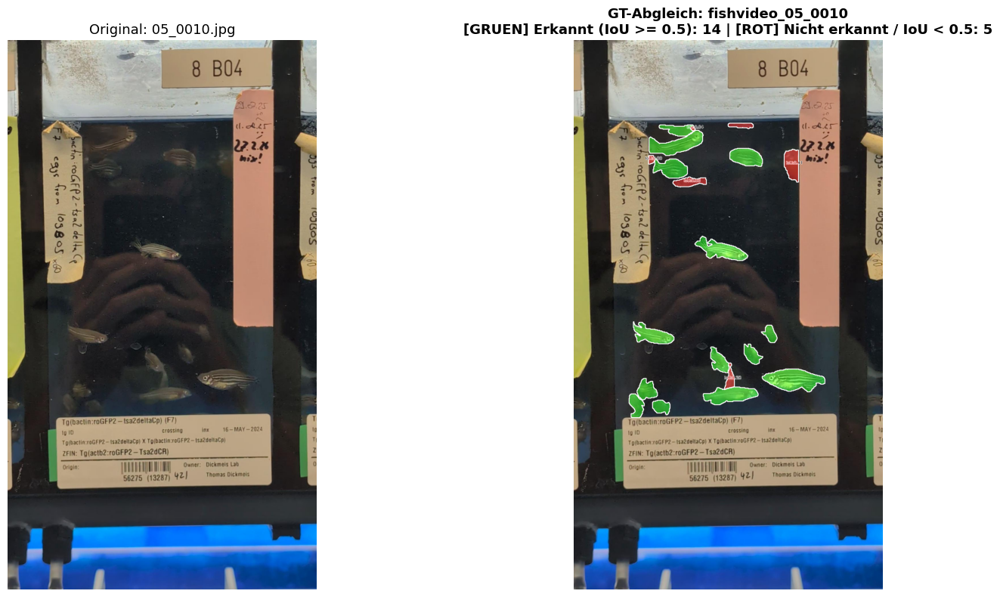

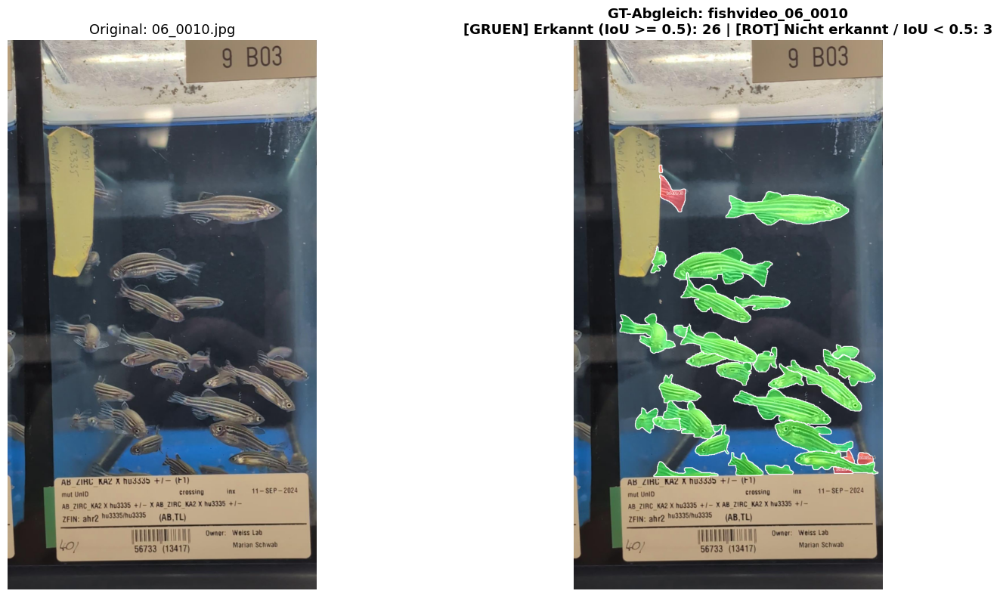

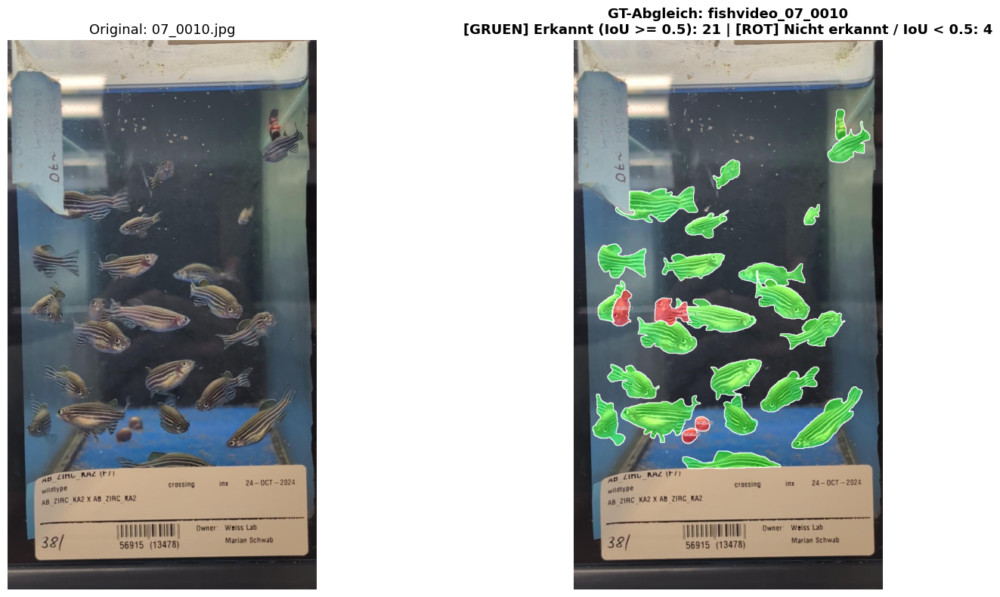

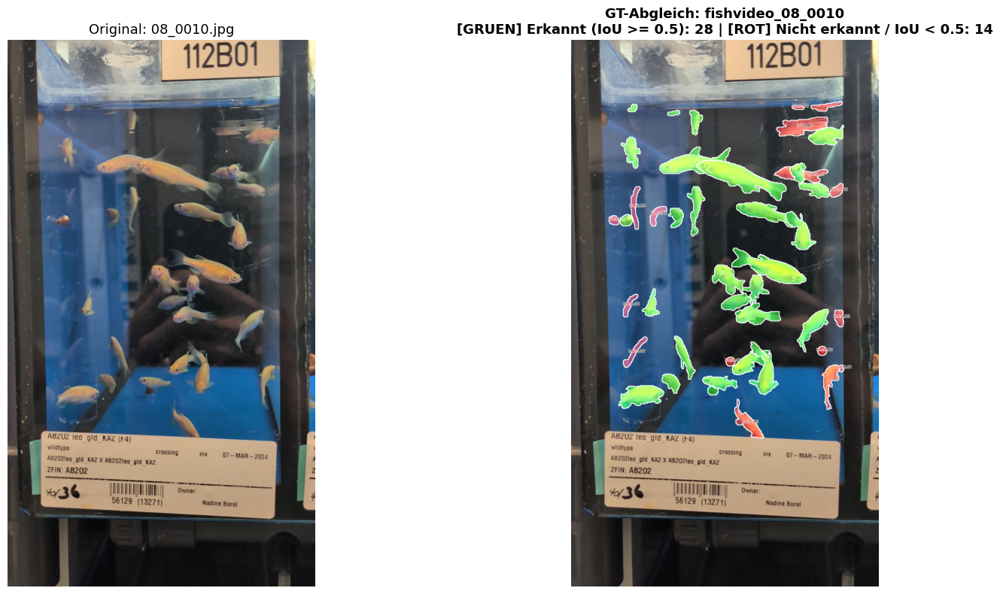

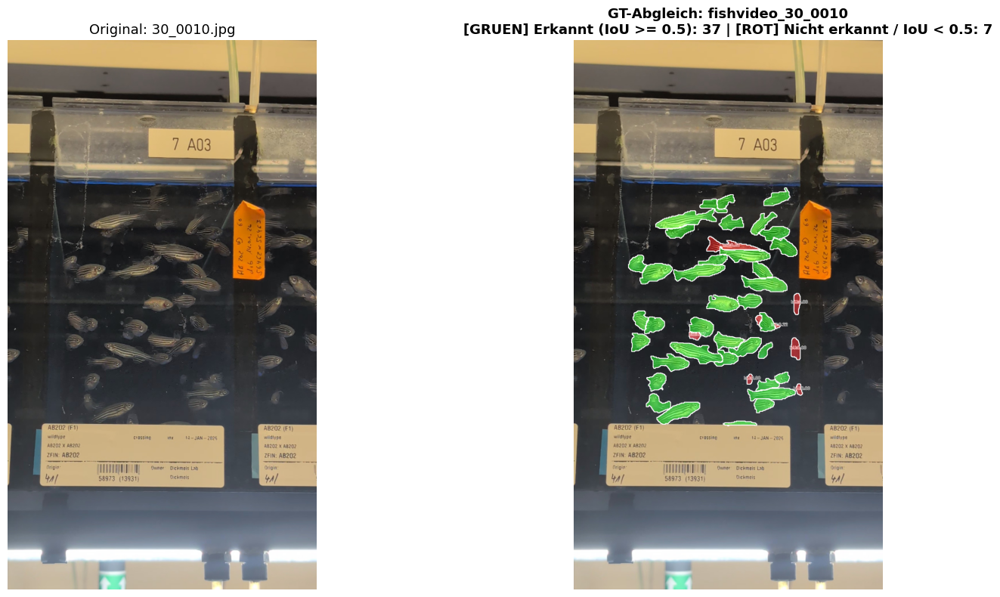

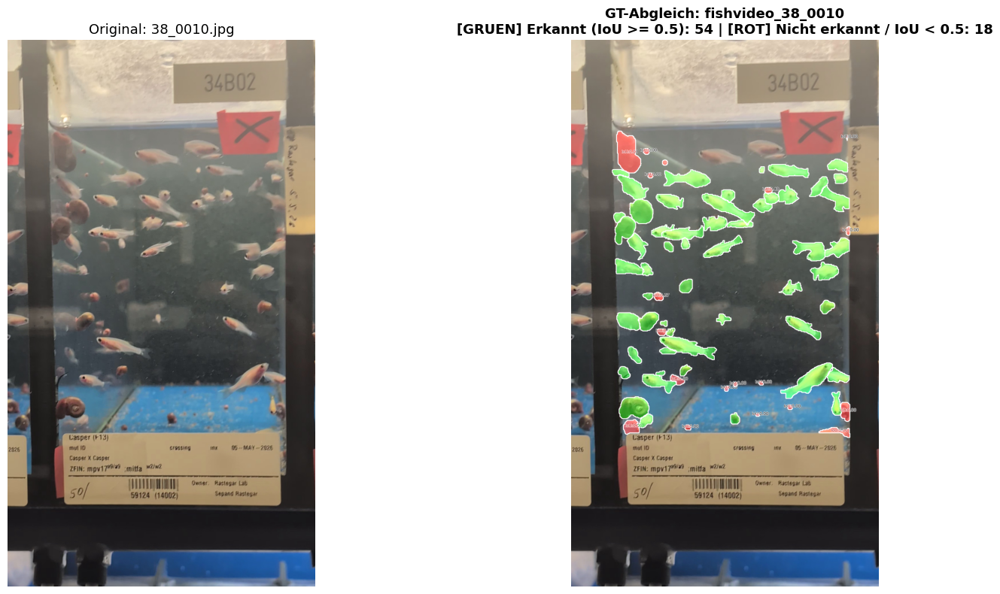

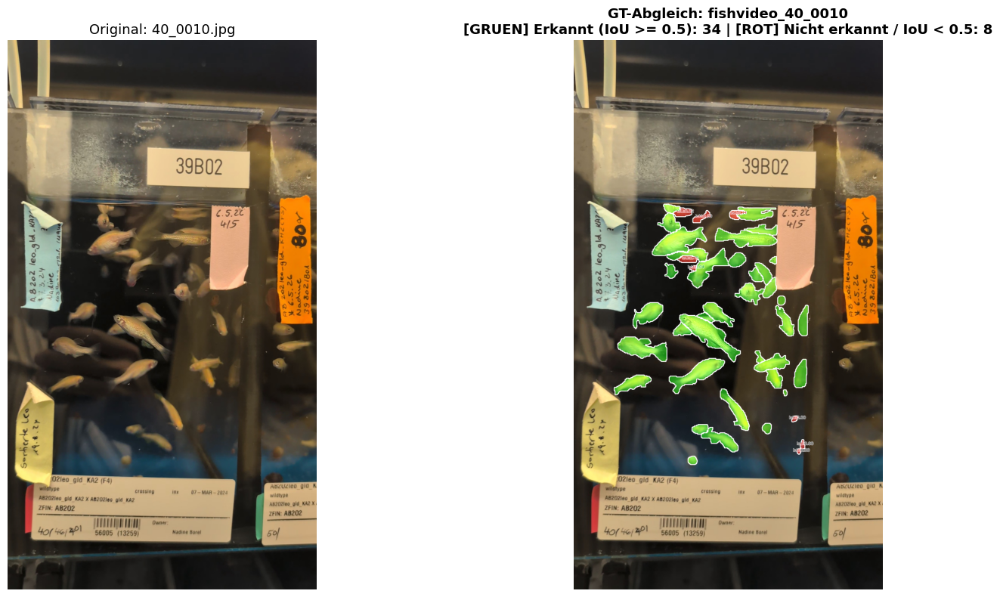

In [25]:
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import numpy as np

# ================= KONFIGURATION =================
IOU_THRESHOLD = 0.50  # Erforderliche Mindestüberdeckung
CONF_THRESHOLD = 0.25  # Konfidenz-Schwelle für YOLO
# =================================================

print("Prüfe Ground-Truth-Labels gegen YOLO-Vorhersagen...\n")

for folder_name in TARGET_FOLDERS:
    folder_path = BASE_GT_DIR / folder_name
    short_name = folder_name.replace("fishvideo_", "")
    possible_imgs = list(IMAGES_DIR.glob(f"*{short_name}*.jpg")) + list(
        IMAGES_DIR.glob(f"*{folder_name}*.jpg")
    )

    if not possible_imgs or not folder_path.exists():
        continue

    img_path = possible_imgs[0]
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]

    # --- 1. Alle GT-Masken für dieses Bild laden ---
    gt_instances = []
    npy_files = list(folder_path.rglob("*.npy")) + list(
        folder_path.rglob("*.npz")
    )

    for npy_file in npy_files:
        data = (
            np.load(npy_file)[list(np.load(npy_file).keys())[0]]
            if npy_file.suffix == ".npz"
            else np.load(npy_file)
        )
        mask = data.astype(np.uint8)
        if mask.ndim == 3:
            mask = mask.squeeze()
        if mask.shape[:2] != (h, w):
            mask = cv2.resize(mask, (w, h), interpolation=cv2.INTER_NEAREST)

        bin_m = (mask > 0).astype(np.uint8)
        if bin_m.sum() > 0:
            gt_instances.append({"mask": bin_m, "filename": npy_file.stem})

    # --- 2. YOLO Vorhersagen für dieses Bild holen ---
    results = model.predict(
        source=str(img_path),
        conf=CONF_THRESHOLD,
        imgsz=max(h, w),
        verbose=False,
    )

    pred_masks = []
    if results[0].masks is not None:
        raw_masks = results[0].masks.data.cpu().numpy()
        for m in raw_masks:
            m_res = cv2.resize(m, (w, h), interpolation=cv2.INTER_NEAREST)
            bin_p = (m_res > 0.5).astype(np.uint8)
            if bin_p.sum() > 0:
                pred_masks.append(bin_p)

    # --- 3. Matching durchführen (GT gegen YOLO) ---
    def calc_iou(m1, m2):
        inter = np.logical_and(m1, m2).sum()
        union = np.logical_or(m1, m2).sum()
        return inter / union if union > 0 else 0.0

    hit_count = 0
    miss_count = 0

    overlay = img_rgb.copy()
    color_mask_layer = np.zeros((h, w, 3), dtype=np.uint8)

    for gt in gt_instances:
        gt_m = gt["mask"]

        best_iou = 0.0
        for p_m in pred_masks:
            iou = calc_iou(gt_m, p_m)
            if iou > best_iou:
                best_iou = iou

        contours, _ = cv2.findContours(
            gt_m, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
        )
        if not contours:
            continue

        M = cv2.moments(contours[0])
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
        else:
            cX, cY = contours[0][0][0]

        # Treffer (Grün) oder Verfehlt (Rot)
        if best_iou >= IOU_THRESHOLD:
            hit_count += 1
            color = [0, 255, 0]  # Grün
            color_mask_layer[gt_m == 1] = color
            cv2.polylines(
                overlay,
                contours,
                isClosed=True,
                color=(255, 255, 255),
                thickness=2,
            )
        else:
            miss_count += 1
            color = [255, 0, 0]  # Rot
            color_mask_layer[gt_m == 1] = color
            cv2.polylines(
                overlay,
                contours,
                isClosed=True,
                color=(255, 255, 255),
                thickness=2,
            )

            text = f"IoU:{best_iou:.2f}"
            cv2.putText(
                overlay,
                text,
                (cX - 20, cY),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.45,
                (255, 255, 255),
                2,
                cv2.LINE_AA,
            )
            cv2.putText(
                overlay,
                text,
                (cX - 20, cY),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.45,
                (0, 0, 0),
                1,
                cv2.LINE_AA,
            )

    overlay = cv2.addWeighted(overlay, 1.0, color_mask_layer, 0.45, 0)

    # --- 4. Plot anzeigen ---
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    axes[0].imshow(img_rgb)
    axes[0].set_title(f"Original: {img_path.name}", fontsize=13)
    axes[0].axis("off")

    axes[1].imshow(overlay)
    axes[1].set_title(
        f"GT-Abgleich: {folder_name}\n"
        f"[GRUEN] Erkannt (IoU >= {IOU_THRESHOLD}): {hit_count} | [ROT] Nicht erkannt / IoU < {IOU_THRESHOLD}: {miss_count}",
        fontsize=13,
        fontweight="bold",
    )
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()